In [ ]:
# !pip install supervision ultralytics
# !pip install "rfdetr[metrics]" # For TensorBoard/W&B logging

# !pip install -q rfdetr==1.1.0

# !pip install --upgrade --force-reinstall rfdetr supervision ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 33.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 85.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 70.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 45.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12


In [ ]:
# --- Mount Google Drive ---
from google.colab import drive
drive.mount('/content/drive')

print("Google Drive mounted.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted.


In [ ]:
import os
from google.colab import userdata

os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")
os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

In [ ]:
import os
import torch
from rfdetr import RFDETRBase, RFDETRLarge
import supervision as sv
import matplotlib.pyplot as plt
import pandas as pd
import glob # For finding files with patterns
import re   # For parsing epoch numbers from filenames
import datetime


# --- Configuration ---
DATASET_ROOT_DIR = "/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted"
TIMESTAMP = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
OUTPUT_DIR = os.path.join(DATASET_ROOT_DIR, "rfdetr_output") # Directory for saving checkpoints and logs
# Ensure the output directory exists
os.makedirs(OUTPUT_DIR, exist_ok=True)


# Number of classes on the dataset
num_classes = 2
NUM_CLASSES = 2


# Define training parameters

TRAIN_MODEL = False   # set True if you want to train the model, set False for inference/test only.

EPOCHS = 50 # Recommended to train for at least 50 epochs for production models

# Adjust based on your GPU memory (e.g., 2, 4, 8)
BATCH_SIZE = 2    # Adjust based on your GPU memory (T4 has 16GB, A100 has 40GB/80GB)
                  # If you get out of memory errors, reduce batch_size or increase grad_accum_steps

GRAD_ACCUM_STEPS = 4 # Gradient accumulation steps
LEARNING_RATE = 1e-4


## Original Dataset Structure

In [ ]:
# ./drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/
# ├── train/
# │   ├── coco_train.json  (Your annotation file)
# │   └── images/          (Your images for training)
# │       ├── image_001.jpg
# │       └── ...
# ├── val/
# │   ├── coco_val.json    (Your annotation file)
# │   └── images/          (Your images for validation)
# │       ├── image_002.jpg
# │       └── ...
# └── test/
#     ├── coco_test.json   (Your annotation file)
#     └── images/          (Your images for testing/inference)
#         ├── image_003.jpg
#         └── ...

## Fix dataset structure

In [ ]:
# %cd /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted

# !mv train/coco_train.json train/_annotations.coco.json
# !mv val/coco_val.json val/_annotations.coco.json
# !mv test/coco_test.json test/_annotations.coco.json

In [ ]:
# %cd /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted

# !mv train/images/* train/
# !rmdir train/images/ # Remove the now empty images folder

# !mv valid/images/* valid/
# !rmdir valid/images/ # Remove the now empty images folder

# !mv test/images/* test/
# !rmdir test/images/ # Remove the now empty images folder

This is the need it data structure for RF-DETR training:

In [ ]:

# dataset/
# ├── train/
# │   ├── _annotations.coco.json
# │   ├── image1.jpg
# │   ├── image2.jpg
# │   └── ...
# ├── valid/
# │   ├── _annotations.coco.json
# │   ├── image1.jpg
# │   ├── image2.jpg
# │   └── ...
# └── test/
#     ├── _annotations.coco.json
#     ├── image1.jpg
#     ├── image2.jpg
#     └── ...

Validate Annotation Files

In [ ]:
import json
from PIL import Image # For checking image dimensions
import os

# --- Configuration ---
DATASET_DIR = "/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted"
TRAIN_ANNOTATION_FILE = os.path.join(DATASET_DIR, "train", "_annotations.coco.json")
VAL_ANNOTATION_FILE = os.path.join(DATASET_DIR, "valid", "_annotations.coco.json")

# Define the number of classes based on your model's expectation (0 to num_classes - 1)
EXPECTED_NUM_CLASSES = 2 # For 'CANS', 'PET' -> class IDs 0 and 1

def validate_coco_annotations(json_path, image_dir, expected_num_classes):
    print(f"\n--- Validating {json_path} ---")
    issues_found = 0

    try:
        with open(json_path, 'r') as f:
            coco_data = json.load(f)
    except FileNotFoundError:
        print(f"Error: Annotation file not found at {json_path}")
        return

    images_info = {img['id']: img for img in coco_data.get('images', [])}

    # Validate Categories
    category_ids = set()
    for cat in coco_data.get('categories', []):
        category_ids.add(cat.get('id'))

    if not all(0 <= cat_id < expected_num_classes for cat_id in category_ids):
        print(f"WARNING: Category IDs in '{json_path}' are not within the expected range [0, {expected_num_classes-1}]. Found: {sorted(list(category_ids))}")
        issues_found += 1

    # Validate Annotations
    for ann in coco_data.get('annotations', []):
        ann_id = ann.get('id', 'N/A')
        image_id = ann.get('image_id')
        category_id = ann.get('category_id')
        bbox = ann.get('bbox') # [x, y, width, height]

        # Check for invalid category_id
        if category_id is None or not (0 <= category_id < expected_num_classes):
            print(f"ISSUE: Annotation ID {ann_id} has invalid category_id: {category_id}. Must be between 0 and {expected_num_classes-1}.")
            issues_found += 1

        # Check bounding box format and values
        if not isinstance(bbox, list) or len(bbox) != 4:
            print(f"ISSUE: Annotation ID {ann_id} has invalid bbox format: {bbox}.")
            issues_found += 1
            continue # Skip further bbox checks if format is wrong

        x, y, w, h = bbox
        if not all(isinstance(val, (int, float)) for val in [x, y, w, h]):
            print(f"ISSUE: Annotation ID {ann_id} has non-numeric bbox values: {bbox}.")
            issues_found += 1
            continue

        if w <= 0 or h <= 0:
            print(f"ISSUE: Annotation ID {ann_id} has zero or negative width/height: {bbox}.")
            issues_found += 1

        # Check if bbox is within image bounds
        if image_id in images_info:
            img_info = images_info[image_id]
            img_width = img_info.get('width')
            img_height = img_info.get('height')
            img_file_name = img_info.get('file_name')
            full_image_path = os.path.join(image_dir, img_file_name)

            if img_width is None or img_height is None:
                # Try to load image to get dimensions if not in JSON (less common for COCO)
                try:
                    with Image.open(full_image_path) as img:
                        img_width, img_height = img.size
                except Exception as e:
                    print(f"WARNING: Could not get dimensions for image {img_file_name}. Error: {e}")

            if img_width is not None and img_height is not None:
                if x < 0 or y < 0 or x + w > img_width or y + h > img_height:
                    print(f"ISSUE: Annotation ID {ann_id} (Image {img_file_name}) has bbox out of bounds: {bbox} (Image size: {img_width}x{img_height}).")
                    issues_found += 1
        else:
            print(f"WARNING: Annotation ID {ann_id} refers to non-existent image_id: {image_id}.")


    # Check if all image files exist on disk
    for img_info in coco_data.get('images', []):
        img_file_name = img_info.get('file_name')
        if img_file_name:
            full_image_path = os.path.join(image_dir, img_file_name)
            if not os.path.exists(full_image_path):
                print(f"ISSUE: Image file not found on disk: {full_image_path} referenced in JSON.")
                issues_found += 1
        else:
            print(f"ISSUE: Image entry with no 'file_name' in JSON: {img_info}")
            issues_found += 1

    if issues_found == 0:
        print(f"Validation complete for {json_path}. No major issues found.")
    else:
        print(f"Validation complete for {json_path}. Found {issues_found} issues. Please review.")

# --- Run Validation ---
validate_coco_annotations(TRAIN_ANNOTATION_FILE, os.path.join(DATASET_DIR, "train"), EXPECTED_NUM_CLASSES)
validate_coco_annotations(VAL_ANNOTATION_FILE, os.path.join(DATASET_DIR, "valid"), EXPECTED_NUM_CLASSES)


--- Validating /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/train/_annotations.coco.json ---
Validation complete for /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/train/_annotations.coco.json. No major issues found.

--- Validating /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/valid/_annotations.coco.json ---
Validation complete for /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/valid/_annotations.coco.json. No major issues found.


Fix annotation files categoryId

In [ ]:
# import json
# import os

# # --- Configuration ---
# DATASET_ROOT_DIR = "/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted"

# # List of annotation files to fix
# ANNOTATION_FILES = [
#     os.path.join(DATASET_ROOT_DIR, "train", "_annotations.coco.json"),
#     os.path.join(DATASET_ROOT_DIR, "valid", "_annotations.coco.json"),
#     os.path.join(DATASET_ROOT_DIR, "test", "_annotations.coco.json"),
# ]

# def fix_category_ids_in_coco(json_path):
#     print(f"--- Processing: {json_path} ---")
#     try:
#         with open(json_path, 'r') as f:
#             coco_data = json.load(f)
#     except FileNotFoundError:
#         print(f"Error: File not found at {json_path}. Skipping.")
#         return
#     except json.JSONDecodeError:
#         print(f"Error: Invalid JSON format in {json_path}. Skipping.")
#         return

#     # Keep track of old to new ID mapping for the categories list itself
#     old_id_to_new_id_map = {}

#     # 1. Update category IDs in the 'categories' list
#     if 'categories' in coco_data:
#         for category in coco_data['categories']:
#             old_id = category.get('id')
#             if old_id is not None:
#                 new_id = old_id - 1
#                 category['id'] = new_id
#                 old_id_to_new_id_map[old_id] = new_id
#                 print(f"  Category: '{category.get('name', 'N/A')}' ID changed from {old_id} to {new_id}")

#     # 2. Update category IDs in the 'annotations' list
#     annotations_fixed_count = 0
#     if 'annotations' in coco_data:
#         for annotation in coco_data['annotations']:
#             old_category_id = annotation.get('category_id')
#             if old_category_id is not None:
#                 if old_category_id in old_id_to_new_id_map:
#                     annotation['category_id'] = old_id_to_new_id_map[old_category_id]
#                     annotations_fixed_count += 1
#                 else:
#                     # This case should ideally not happen if categories list was processed first
#                     # But as a fallback, just decrement if not in map (assuming direct 1-to-0, 2-to-1)
#                     if old_category_id in [1, 2]: # Only for expected IDs 1 and 2
#                         annotation['category_id'] = old_category_id - 1
#                         annotations_fixed_count += 1
#                         print(f"  Warning: Annotation category_id {old_category_id} not found in categories map, but decremented directly.")
#                     else:
#                         print(f"  Warning: Annotation category_id {old_category_id} found outside expected range [1,2] for decrementing. Not changed.")


#     print(f"  Fixed {annotations_fixed_count} annotations.")

#     # Save the modified JSON data back to the file
#     try:
#         with open(json_path, 'w') as f:
#             json.dump(coco_data, f, indent=4) # indent for readability
#         print(f"Successfully updated {json_path}")
#     except Exception as e:
#         print(f"Error saving {json_path}: {e}")

# # --- Mount Google Drive ---
# from google.colab import drive
# drive.mount('/content/drive')
# print("Google Drive mounted.")

# # --- Run the fix for all specified files ---
# for file_path in ANNOTATION_FILES:
#     fix_category_ids_in_coco(file_path)

# print("\n--- Annotation file fixing process complete ---")
# print("You can now proceed with your RF-DETR training.")

In [ ]:
import torch

# Determine the available device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# --- Debugging: Set CUDA blocking for better error messages ---
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

if torch.cuda.is_available():
    print("🎉 CUDA is available! Training will use the GPU.")
    print(f"CUDA device count: {torch.cuda.device_count()}")
    print(f"Current CUDA device: {torch.cuda.current_device()}")
    print(f"Device name: {torch.cuda.get_device_name(0)}")

    !nvidia-smi

else:
    print("⚠️ WARNING: CUDA is NOT available. Training will be extremely slow on CPU.")
    print("Please go to 'Runtime' -> 'Change runtime type' and select a GPU (e.g., T4 GPU or A100 GPU), then restart your runtime and re-run all setup cells.")


⚠️ WARNING: CUDA is NOT available. Training will be extremely slow on CPU.
Please go to 'Runtime' -> 'Change runtime type' and select a GPU (e.g., T4 GPU or A100 GPU), then restart your runtime and re-run all setup cells.


# Initialize Model

Find and Load (if any) Latest Checkpoint

In [ ]:
# This function now ONLY finds the path and tries to infer epoch
# It does NOT attempt to load the checkpoint data itself to avoid the error here.
# This function now returns:
# 1. The path to the checkpoint that is chronologically latest.
# 2. The highest epoch number found in any 'checkpoint00XX.pth' file, for logging consistency.

def find_latest_checkpoint(checkpoint_dir):


    candidate_files = [] # Stores (file_path, modification_time, inferred_epoch)
    max_numbered_epoch_found = 0

    all_pth_files = glob.glob(os.path.join(checkpoint_dir, "*.pth"))

    print(f"All .pth files found in {checkpoint_dir}: {all_pth_files}")


    for cp_path in all_pth_files:
        filename = os.path.basename(cp_path)
        mod_time = os.path.getmtime(cp_path)
        inferred_epoch = 0 # Default if epoch cannot be parsed from filename

        # Try to parse epoch from checkpoint00XX.pth pattern
        match = re.match(r"checkpoint(\d+)\.pth$", filename)
        if match:
            try:
                epoch_num = int(match.group(1))
                inferred_epoch = epoch_num
                if epoch_num > max_numbered_epoch_found:
                    max_numbered_epoch_found = epoch_num
            except ValueError:
                pass # Not a valid epoch number (e.g., 'checkpoint.pth', 'best_ema.pth')

        candidate_files.append((cp_path, mod_time, inferred_epoch))

    if not candidate_files:
        print("No valid checkpoints found across any previous run.")
        return None, 0, 0

    # Sort candidates by modification time (descending), then by inferred epoch (descending)
    candidate_files.sort(key=lambda x: (x[1], x[2]), reverse=True)

    resume_checkpoint_path = candidate_files[0][0]

    print(f"Chosen checkpoint path for resume (chronologically latest from all runs): {resume_checkpoint_path}")
    print(f"Highest numbered epoch found across all runs: {max_numbered_epoch_found}")

    return resume_checkpoint_path, max_numbered_epoch_found


In [ ]:

# --- Initialize Model and Check for Resume ---
model_type = RFDETRBase # Or RFDETRLarge
# RFDETRBase (29M parameters, faster)
# RFDETRLarge (129M parameters, more accurate).
# For most custom datasets, RFDETRBase is a good starting point.

model = None # Initialize to None, will be set based on resume logic


# --- Determine Resume Path and Start Epoch ---
start_epoch_for_logging_display = 0 # This is what will be passed to model.train(start_epoch=...)
max_actual_completed_epoch = 0 # The highest true epoch completed in any checkpoint


# Try to find and load a checkpoint
checkpoint_path_found, max_actual_completed_epoch = find_latest_checkpoint(OUTPUT_DIR)

if checkpoint_path_found:
    checkpoint_to_load_for_resume = checkpoint_path_found
    start_epoch_for_logging_display = max_actual_completed_epoch + 1

    try:
        # Load checkpoint via pretrain_weights in constructor
        # This is the rfdetr library's intended way to load model weights (including from checkpoints)
        model = model_type(
            num_classes=NUM_CLASSES,
            pretrain_weights=checkpoint_to_load_for_resume
        )
        print(f"✅ Model detected! Using checkpoint: {checkpoint_to_load_for_resume}.")
        print(f" >>> Training will resume from epoch: {start_epoch_for_logging_display}.")

    except Exception as e:

        print(f"❌ ERROR: Failed to load model using pretrain_weights from {checkpoint_to_load_for_resume}. Error: {e}")
        print("⏺️ Starting training from scratch with default pre-trained weights.")
        model = model_type(num_classes=NUM_CLASSES) # Fallback to default pre-trained weights (rf-detr-base.pth)
        start_epoch_for_logging_display = 0
        checkpoint_to_load_for_resume = None # Clear resume path

else:
    print("⏺️ No checkpoint to resume from. Starting training from epoch 0 with default pre-trained weights.")
    model = model_type(num_classes=NUM_CLASSES) # Initialize with default pre-trained weights (rf-detr-base.pth)



# --- DEBUGGING PRINTS ---
print("\n--- Model Debugging Info ---")
print(f"Type of 'model': {type(model)}")
# print(f"Is 'model' an instance of torch.nn.Module? {isinstance(model, torch.nn.Module)}")
# print(f"Does 'model' have 'load_state_dict' attribute? {hasattr(model, 'load_state_dict')}")
# print(f"Does 'model' have 'parameters' attribute? {hasattr(model, 'parameters')}")




All .pth files found in /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output: ['/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/checkpoint_best_regular.pth', '/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/checkpoint0009.pth', '/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/checkpoint0019.pth', '/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/checkpoint0029.pth', '/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/checkpoint0039.pth', '/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/checkpoint_best_ema.pth', '/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/checkpoint.pth', '/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/loopvision_2025Jun25.pth']
Chosen checkpoint path for resume (

reinitializing detection head with 1 classes


✅ Model detected! Using checkpoint: /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/loopvision_2025Jun25.pth.
 >>> Training will resume from epoch: 40.

--- Model Debugging Info ---
Type of 'model': <class 'rfdetr.detr.RFDETRBase'>


In [ ]:

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# model.to(device)
# --- Removed: Manual model.to(device) ---
# The rfdetr.train() method will handle moving the model to GPU.
# The 'device' variable is no longer explicitly used here but is often inferred by rfdetr.
# It was previously used to print the device name, but now its primary use is removed.


print(f"Model will attempt to use device:{device}")


# Enable CUDA blocking for better error messages
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

Model will attempt to use device:cpu


# Train model

Start Logging

In [ ]:
# TensorBoard Monitoring
%load_ext tensorboard
# %tensorboard --logdir OUTPUT_DIR
%tensorboard --logdir OUTPUT_DIR --port 6006

# print(f"%tensorboard --logdir {OUTPUT_DIR.rsplit('/', 1)[0]} --port 6006") # Point to parent dir to see all runs
# print("You may need to manually navigate to the latest 'rfdetr_output_YYYYMMDD_HHMMSS' run within TensorBoard.")



The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2270), started 0:23:17 ago. (Use '!kill 2270' to kill it.)

<IPython.core.display.Javascript object>

Train

In [ ]:

# --- Training Callback for History and TensorBoard setup ---
history = []
def callback_fn(data):
    history.append(data)
model.callbacks["on_fit_epoch_end"].append(callback_fn)


# --- Start Training ---
print(f"\n--- Starting RF-DETR Training ---")
print(f"Total epochs: {EPOCHS}, Starting epoch: {start_epoch_for_logging_display}")
print(f"Effective total batch size: {BATCH_SIZE * GRAD_ACCUM_STEPS}")


In [ ]:
if TRAIN_MODEL:

  try:
      model.train(
          dataset_dir=DATASET_ROOT_DIR,
          epochs=EPOCHS,
          batch_size=BATCH_SIZE,
          grad_accum_steps=GRAD_ACCUM_STEPS,
          lr=LEARNING_RATE,
          output_dir=OUTPUT_DIR,
          tensorboard=True,
          start_epoch=start_epoch_for_logging_display, # For logging consistency
          # checkpoint_interval=CHECKPOINT_SAVE_INTERVAL # Save checkpoint every X epochs
      )
      print("\n--- Training Complete! ---")
  except RuntimeError as e:
      print(f"\n--- Training Interrupted by RuntimeError: {e} ---")
      print("If it's a CUDA error, re-check your dataset annotations and GPU memory, or consider reducing batch size.")
  except Exception as e:
      print(f"\n--- Training Interrupted: {e} ---")

else:
    print("\n No training today. Set TRAIN_MODEL=True if need it.")



--- Starting RF-DETR Training ---
Total epochs: 50, Starting epoch: 40
Effective total batch size: 8
TensorBoard logging initialized. To monitor logs, use 'tensorboard --logdir /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output' and open http://localhost:6006/ in browser.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=2, grad_accum_steps=4, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=2, weight_decay=0.0001, epochs=50, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-base.pth', pretrain_exclude_keys=None, pretrain_keys_modify_to_load=None, pretrained_distiller=None, encoder='dinov2_windowed_small', vit_encoder_num_layers=12, window_block_indexes=None, position_embedding='sine', out_feature_indexes=[2, 5, 8, 11],

Training Loss Plot

In [ ]:
# --- Plot Training Loss (after training or interruption) ---
if history:
    df = pd.DataFrame(history)
    plt.figure(figsize=(12, 8))
    if 'train_loss' in df.columns:
        plt.plot(df['epoch'], df['train_loss'], label='Training Loss', marker='o', linestyle='-')
    if 'val_loss' in df.columns:
        plt.plot(df['epoch'], df['val_loss'], label='Validation Loss', marker='o', linestyle='-')

    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss Over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("\nNo training history recorded during this run.")




No training history recorded during this run or training did not proceed far enough to log history.


In [ ]:
# from PIL import Image

# Image.open("/content/output/metrics_plot.png")

FileNotFoundError: [Errno 2] No such file or directory: '/content/output/metrics_plot.png'

# Load the Fine-tuned Model for Inference:

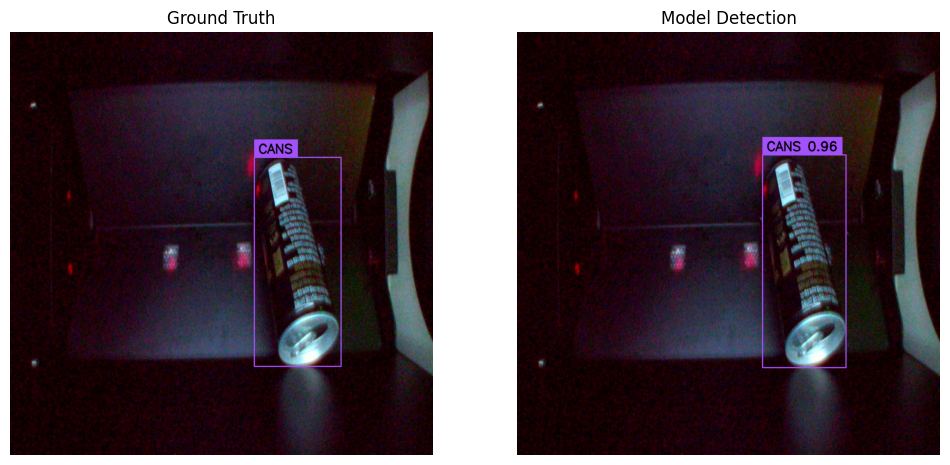

In [ ]:
from rfdetr import RFDETRBase
import supervision as sv
from PIL import Image


# Get test dataset
ds = sv.DetectionDataset.from_coco(
    images_directory_path=f"{DATASET_ROOT_DIR}/test",
    annotations_path=f"{DATASET_ROOT_DIR}/test/_annotations.coco.json",
)

# Get sample image
path, image, annotations = ds[0]
image = Image.open(path)

#Make model detection
detections = model.predict(image, threshold=0.5)

text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

bbox_annotator = sv.BoxAnnotator(thickness=thickness)
label_annotator = sv.LabelAnnotator(
    text_color=sv.Color.BLACK,
    text_scale=text_scale,
    text_thickness=thickness,
    smart_position=True)

annotations_labels = [
    f"{ds.classes[class_id]}"
    for class_id
    in annotations.class_id
]

detections_labels = [
    f"{ds.classes[class_id]} {confidence:.2f}"
    for class_id, confidence
    in zip(detections.class_id, detections.confidence)
]

annotation_image = image.copy()
annotation_image = bbox_annotator.annotate(annotation_image, annotations)
annotation_image = label_annotator.annotate(annotation_image, annotations, annotations_labels)

detections_image = image.copy()
detections_image = bbox_annotator.annotate(detections_image, detections)
detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

sv.plot_images_grid(images=[annotation_image, detections_image], grid_size=(1, 2), titles=["Ground Truth", "Model Detection"])

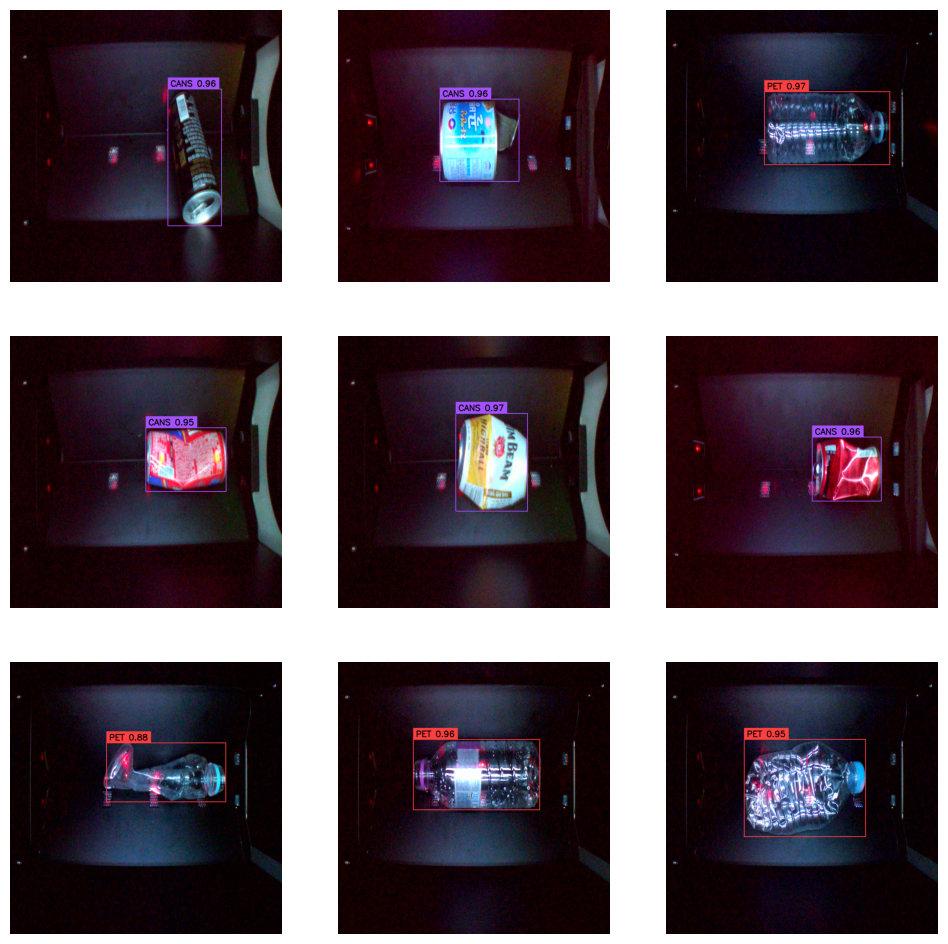

In [ ]:
import supervision as sv
from rfdetr import RFDETRBase
from PIL import Image

detections_images = []

for i in range(9):
    path, image, annotations = ds[i]
    image = Image.open(path)

    #Make model detections
    detections = model.predict(image, threshold=0.5)

    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

    bbox_annotator = sv.BoxAnnotator(thickness=thickness)
    label_annotator = sv.LabelAnnotator(
        text_color=sv.Color.BLACK,
        text_scale=text_scale,
        text_thickness=thickness,
        smart_position=True)

    detections_labels = [
        f"{ds.classes[class_id]} {confidence:.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    detections_image = image.copy()
    detections_image = bbox_annotator.annotate(detections_image, detections)
    detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

    detections_images.append(detections_image)

sv.plot_images_grid(images=detections_images, grid_size=(3, 3), size=(12, 12))

# Evaluate Fine-tuned model

In [ ]:
import supervision as sv
from tqdm import tqdm
from supervision.metrics import MeanAveragePrecision

targets = []
predictions = []

for path, image, annotations in tqdm(ds):
    image = Image.open(path)
    detections = model.predict(image, threshold=0.5)

    targets.append(annotations)
    predictions.append(detections)

100%|██████████| 46/46 [03:27<00:00,  4.52s/it]


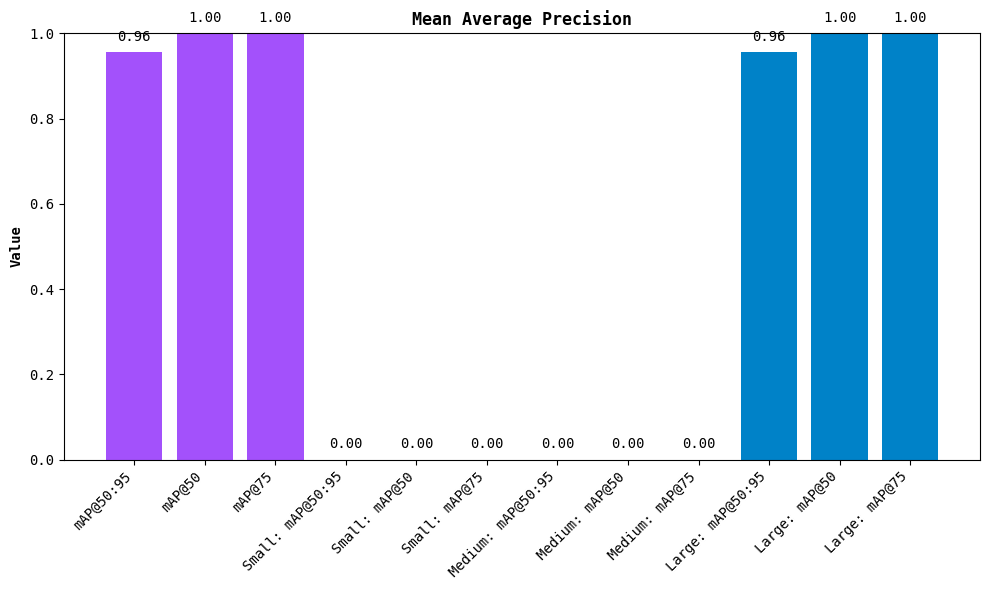

In [ ]:
map_metric = MeanAveragePrecision()
map_result = map_metric.update(predictions, targets).compute()

map_result.plot()

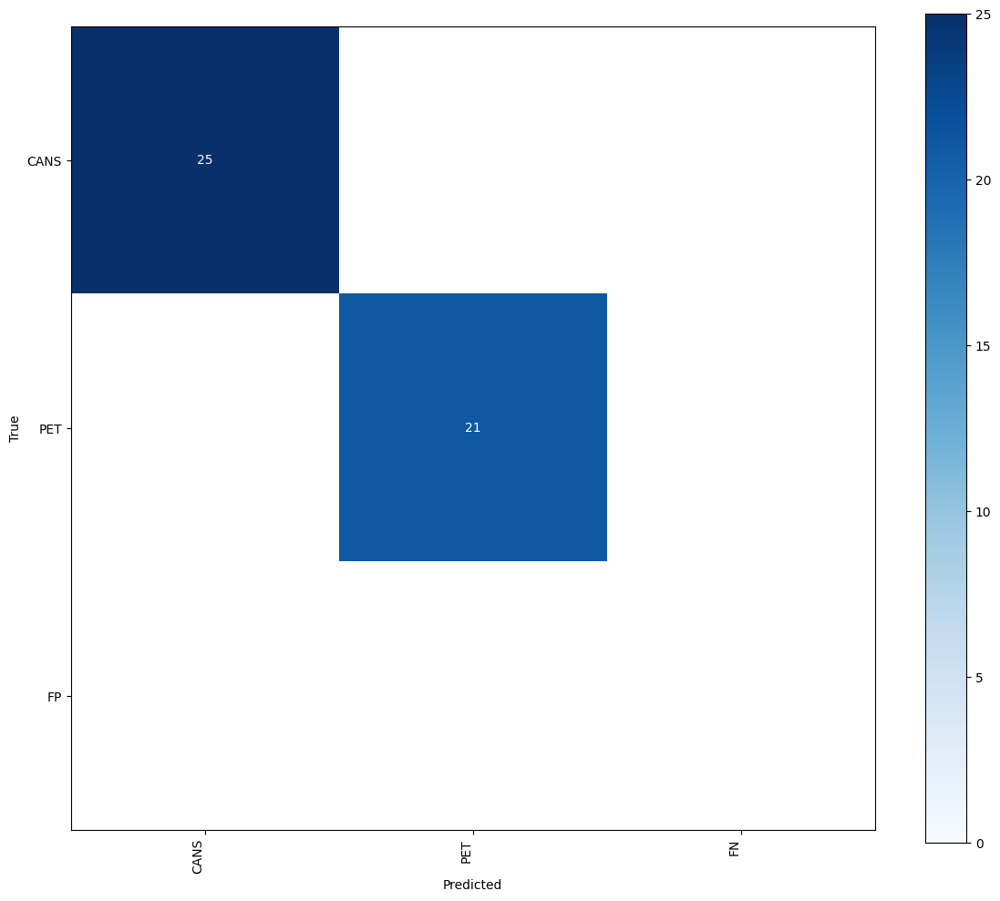

In [ ]:
confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=ds.classes
)

confusion_matrix.plot()

# Convert Model to ONNX format

In [ ]:
!pip install torch torchvision onnxruntime pillow numpy
# !pip install -q rfdetr==1.1.0

In [ ]:

import torch
import torchvision
from rfdetr import RFDETRBase


NUM_CLASSES = 2

ROOT_DIR = "/content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output"
MODEL_DIR = os.path.join(ROOT_DIR, "checkpoint.pth")

out_model_name = "loopvision_2025Jun25.onnx"

# Determine the available device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# # Load model
# model = RFDETRBase(
#             device='cpu',
#             num_classes=NUM_CLASSES,
#             pretrain_weights=MODEL_DIR
#         )

# Initialize the model
# model = RFDETRBase(device='cpu')
my_model = model.model.model
my_model.to(device)


# # Create a dummy input tensor matching your model's expected input shape
# # Example for an image (batch_size, channels, height, width)
# dummy_input = torch.randn(1, 3, 1024, 1024)

dummy_input = torch.randn(1, 3, 560, 560).to(device)  # Example input: batch size 1, 3 channels, 560x560

# Run a forward pass to check output structure
output = my_model(dummy_input)
print("Model output keys:", output.keys())


# Move the model to export mode
my_model.export()

# # Export the model to ONNX
print(f"Exporting model to {out_model_name}...")
torch.onnx.export(
    my_model,                # Model to export
    dummy_input,             # Dummy input tensor
    out_model_name,              # Output ONNX file name
    export_params=True,      # Store trained parameters
    opset_version=14,        # ONNX version
    do_constant_folding=True,# Optimize constant expressions
    input_names=["input"],   # Define input tensor name
    output_names=list(output.keys())[:2]  # Use first two keys as output names
)

print(f"Model successfully exported as {out_model_name}")


RuntimeError: The size of tensor a (300) must match the size of tensor b (3900) at non-singleton dimension 1

In [ ]:
# !pip install onnx-tf # For ONNX to TensorFlow SavedModel conversion
# !pip pip install tensorflow==2.15.0 # Ensure compatible TensorFlow version with onnx-tf if needed
# !pip install tensorflowjs # For TensorFlow SavedModel to TensorFlow.js conversion


# Step 0: RESTART YOUR RUNTIME/KERNEL NOW!
# In Google Colab, go to Runtime -> Restart runtime.

# Step 1: Aggressively uninstall all potentially conflicting packages
!echo "Step 1: Aggressively uninstalling all TensorFlow-related, Keras, and ONNX packages..."
!pip uninstall -y tensorflow tensorflow-addons tensorflow-probability onnx-tf tensorboard keras keras-nightly onnx onnxruntime

# Optional: Clear pip cache if issues persist (sometimes helps with stubborn installs)
!pip cache purge

# Step 2: Install core TensorFlow 2.11.0 (a version often more stable with onnx-tf)
!echo "Step 2: Installing core TensorFlow 2.12.0 (CPU version)..."
!pip install tensorflow==2.12.0

# Step 3: Install tensorflow-probability version compatible with TF 2.11.0
# Version 0.19.0 or 0.20.0 are generally known to work well with TF 2.11.
!echo "Step 3: Installing tensorflow-probability 0.19.0..."
!pip install tensorflow-probability==0.19.0

# Step 4: Install onnx-tf
!echo "Step 4: Installing onnx-tf..."
!pip install onnx-tf


!echo "All dependencies installed. Please re-run your Python script for ONNX to TensorFlow SavedModel conversion now."



Step 1: Aggressively uninstalling all TensorFlow-related, Keras, and ONNX packages...
Found existing installation: tensorflow-addons 0.23.0
Uninstalling tensorflow-addons-0.23.0:
  Successfully uninstalled tensorflow-addons-0.23.0
Found existing installation: onnx 1.18.0
Uninstalling onnx-1.18.0:
  Successfully uninstalled onnx-1.18.0
Files removed: 20
Step 2: Installing core TensorFlow 2.12.0 (CPU version)...
INFO: pip is looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.0/586.0 MB

Step 3: Installing tensorflow-probability 0.19.0...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 44.4 MB/s eta 0:00:00
Step 4: Installing onnx-tf...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.1/226.1 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 81.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 36.0 MB/s eta 0:00:00
All dependencies installed. Please re-run your Python script for ONNX to TensorFlow SavedModel conversion now.


In [ ]:
import onnx
from onnx_tf.backend import prepare
import os

# Define input and output paths

ONNX_MODEL_PATH = "/content/loopvision_2025Jun25.onnx"
TF_SAVED_MODEL_DIR = "loopvision_tf"

print(f"Attempting to convert ONNX model from: {ONNX_MODEL_PATH}")

if not os.path.exists(ONNX_MODEL_PATH):
    print(f"Error: ONNX model not found at {ONNX_MODEL_PATH}.")
    print("Please ensure you have run the PyTorch to ONNX conversion script successfully.")
    exit()

try:
    # Load the ONNX model
    onnx_model = onnx.load(ONNX_MODEL_PATH)
    print("ONNX model loaded successfully.")

    # Prepare the ONNX model for TensorFlow backend
    # This step converts the ONNX graph to a TensorFlow graph.
    tf_rep = prepare(onnx_model)
    print("ONNX model prepared for TensorFlow backend.")

    # Export the TensorFlow graph as a SavedModel
    # This creates a directory containing the model's graph and weights.
    tf_rep.export_graph(TF_SAVED_MODEL_DIR)
    print(f"\nSuccessfully converted ONNX to TensorFlow SavedModel at: {TF_SAVED_MODEL_DIR}")
    print("You can now proceed to convert this SavedModel to TensorFlow.js format.")

except Exception as e:
    print(f"\nAn error occurred during ONNX to TensorFlow SavedModel conversion: {e}")
    print("Common issues: ONNX ops not supported by onnx-tf, or incorrect ONNX model structure.")
    print("Please check the ONNX model's compatibility with onnx-tf.")



/usr/local/lib/python3.11/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.11/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.12.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're u

Attempting to convert ONNX model from: /content/loopvision_2025Jun25.onnx
ONNX model loaded successfully.
ONNX model prepared for TensorFlow backend.

An error occurred during ONNX to TensorFlow SavedModel conversion: in user code:

    File "/usr/local/lib/python3.11/dist-packages/onnx_tf/backend_tf_module.py", line 99, in __call__  *
        output_ops = self.backend._onnx_node_to_tensorflow_op(onnx_node,
    File "/usr/local/lib/python3.11/dist-packages/onnx_tf/backend.py", line 347, in _onnx_node_to_tensorflow_op  *
        return handler.handle(node, tensor_dict=tensor_dict, strict=strict)
    File "/usr/local/lib/python3.11/dist-packages/onnx_tf/handlers/handler.py", line 61, in handle  *
        raise BackendIsNotSupposedToImplementIt("{} version {} is not implemented.".format(node.op_type, cls.SINCE_VERSION))

    BackendIsNotSupposedToImplementIt: Where version 16 is not implemented.

Common issues: ONNX ops not supported by onnx-tf, or incorrect ONNX model structure.
Please c

In [ ]:
# Install tfjs-converter
# !npm install -g @tensorflow/tfjs-converter

!pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.6 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-bigquery 3.34.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


In [ ]:
# tensorflowjs_converter \
#   --input_format=onnx \
#   --output_format=tfjs_graph_model \
#   --output_node_names='loopvision_node' \
#   ./loopvision_2025Jun25.onnx \
#   ./tfjs_model_loopvision


# # Convert your ONNX model to TensorFlow.js format
# !tensorflowjs_converter \
#   --input_format=onnx \
#   --output_format=tfjs_graph_model \
#   --output_node_names='loopvision_node' \
#   ./content/loopvision_2025Jun25.onnx \
#   ./loopvision_web


#TensorFlow.js model converters.: error: argument --input_format: invalid choice: 'onnx' (choose from 'tf_hub', 'keras_keras', 'keras', 'tfjs_layers_model', 'keras_saved_model', 'tf_saved_model', 'tf_frozen_model')

# !tensorflowjs_converter \
#     --input_format=onnx \
#     --output_node_names='LoopVisionV1/Predictions/Reshape_1' \
#     ./content/loopvision_2025Jun25.onnx \
#     ./loopvision_web



!tensorflowjs_converter \
    --input_format=tf_saved_model \
    --output_node_names='LoopVisionV1/Predictions/Reshape_1' \
    --saved_model_tags=serve \
    ./content/loopvision_2025Jun25.onnx \
    ./loopvision_web


2025-06-27 07:52:50.369280: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751010770.399246   20315 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751010770.409079   20315 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-06-27 07:52:50.453396: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
usage:

In [ ]:
# import os
# import torch
# from rfdetr import RFDETRBase # Or RFDETRLarge, depending on what you trained
# import supervision as sv
# from PIL import Image
# import random
# import matplotlib.pyplot as plt


# BEST_MODEL_FILE = "checkpoint.pth"

# # Define your class names in the order corresponding to their 0-indexed IDs
# # (e.g., if CANS was ID 0 and PET was ID 1)
# CLASS_NAMES = ['CANS', 'PET']

# # Path to your best trained model weights
# # You'll need to check the exact filename that RF-DETR saved.
# # It's often something like 'best_model.pth' or 'epoch_XX.pth'
# # Let's assume it saves as 'best_model.pth' in the output directory
# MODEL_WEIGHTS_PATH = os.path.join(OUTPUT_DIR, BEST_MODEL_FILE)

# # Threshold for displaying detections (confidence score)
# CONFIDENCE_THRESHOLD = 0.5 # Adjust as needed (e.g., 0.25 to see more detections)

# # Number of example images to visualize
# NUM_IMAGES_TO_INFER = 5

# # --- 1. Mount Google Drive ---
# from google.colab import drive
# drive.mount('/content/drive')
# print("Google Drive mounted.")

# # --- 2. Load the trained RF-DETR Model ---
# # Initialize the model structure
# # Re-initialize and load state dict to get the trained model
# model = RFDETRBase(num_classes=len(CLASS_NAMES)) # Ensure num_classes matches your dataset

# # Check if model weights file exists
# if not os.path.exists(MODEL_WEIGHTS_PATH):
#     print(f"Error: Model weights not found at {MODEL_WEIGHTS_PATH}")
#     print("Please check the 'OUTPUT_DIR' and 'MODEL_WEIGHTS_PATH' variables.")
#     print("If your training is still running, the 'best_model.pth' might not be saved yet.")
#     # Exit or handle gracefully if weights aren't found
# else:
#     # Load the state dictionary
#     try:
#         # Load to CPU first, then move to GPU if available
#         state_dict = torch.load(MODEL_WEIGHTS_PATH, map_location=torch.device('cpu'))
#         # The state_dict might be nested, e.g., 'model_state_dict' key
#         if 'model_state_dict' in state_dict:
#              model.load_state_dict(state_dict['model_state_dict'])
#         else:
#              model.load_state_dict(state_dict)

#         # Move model to GPU if available
#         device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#         model.to(device)
#         model.eval() # Set model to evaluation mode (important for inference)
#         print(f"Model loaded successfully to {device}.")
#     except Exception as e:
#         print(f"Error loading model weights from {MODEL_WEIGHTS_PATH}: {e}")
#         # Exit or handle gracefully

# # --- 3. Load the Test Dataset using Supervision ---
# test_images_path = os.path.join(DATASET_ROOT_DIR, "test")
# test_annotations_path = os.path.join(DATASET_ROOT_DIR, "test", "_annotations.coco.json")

# try:
#     ds = sv.DetectionDataset.from_coco(
#         images_directory_path=test_images_path,
#         annotations_path=test_annotations_path,
#     )
#     print(f"Test dataset loaded with {len(ds)} images and {len(ds.annotations)} annotations.")
#     print(f"Dataset classes: {ds.classes}")
# except Exception as e:
#     print(f"Error loading test dataset: {e}")
#     # You might want to stop here if the dataset can't be loaded

# # --- 4. Perform Inference and Visualize ---

# # Setup annotators for visualization
# box_annotator = sv.BoxAnnotator()
# label_annotator = sv.LabelAnnotator()

# # Get a list of image names from the dataset
# image_names = list(ds.images.keys())
# if not image_names:
#     print("No images found in the test dataset to infer on.")
# else:
#     # Select a few random images for inference
#     selected_image_names = random.sample(image_names, min(NUM_IMAGES_TO_INFER, len(image_names)))

#     for image_name in selected_image_names:
#         image_path, image_np, annotations = ds[image_name] # image_np is a NumPy array (H, W, 3)
#         image_pil = Image.fromarray(image_np) # Convert to PIL Image for model.predict()

#         print(f"\n--- Inferring on image: {image_name} ---")

#         with torch.no_grad(): # Disable gradient calculation for inference
#             # model.predict returns a sv.Detections object directly
#             detections = model.predict(image_pil, threshold=CONFIDENCE_THRESHOLD)

#         # Map class IDs to class names for labels
#         labels = [
#             f"{CLASS_NAMES[class_id]} {confidence:.2f}"
#             for class_id, confidence in zip(detections.class_id, detections.confidence)
#         ]

#         # Annotate the image
#         annotated_image = image_np.copy()
#         annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
#         annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)

#         # Display the image
#         sv.plot_image(annotated_image, size=(10, 10), title=f"Inference: {image_name}")

# print("\n--- Inference and Visualization Complete ---")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted.
Loading pretrain weights


reinitializing detection head with 90 classes


Error loading model weights from /content/drive/MyDrive/circularnet_auxfiles/rc40cocodataset_splitted/rfdetr_output/checkpoint_best_ema.pth: Weights only load failed. This file can still be loaded, to do so you have two options, do those steps only if you trust the source of the checkpoint. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL argparse.Namespace was not an allowed global by default. Please use `torch.serialization.add_safe_globals([Namespace])` or the `torch.serialization.safe_globals([Namespace])` context manager to allowlist this global if you trust this

SupervisionWarnings: images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.


TypeError: list indices must be integers or slices, not str